# Exploratory Data Analysis

Here we will look at recent sales data for the 5 market areas and try to get a feel for what we have. 

In [190]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

%matplotlib inline

In [191]:
X= pd.read_csv('data/clean_data.csv')

## Part 1. Explore the columns
So far we have kept all the fields. Let's see what we have. 

In [192]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area'],
      dtype='object')

Now we can explore each column one by one, come up with the better representation and then move on to relationships between variables. <br>

#### 'Location' variable.

In [193]:
X['Location'].unique()

array(['UNINCORPORATED', 'BOULDER', 'SUPERIOR', 'LOUISVILLE', 'ERIE',
       'LAFAYETTE', 'LONGMONT', 'LYONS', 'NEDERLAND'], dtype=object)

The only new information we're learning from 'Location' that is not already in a 'Market Area' is whether the location is unincorporated or not. So we can preserve the additional information with a binary variable. We will call new binary variable 'Unincorporated', where if  Unincorporated = 1, otherwise 0. 

In [194]:
X['Unincorporated']= 0
X.loc[X['Location']=='UNINCORPORATED', 'Unincorporated']=1
X['Unincorporated'].sum()

1748

#### 'Design' variable

In [195]:
X['Design'].unique()

array(['Ranch', 'Split level', 'Bi Level', 'Multi Sty', 'Paired',
       '1 Sty Townh', 'Modular', 'Multi Sty Townh', 'Patio',
       '1 Sty Condo', 'Det Mult Sty Condo', 'Multi Sty Condo',
       '1-Sty Twnhm Condo', 'Mutli Sty Twnhm Condo', 'Det 1 Sty Condo'],
      dtype=object)

In [196]:
X['Design_orig']= X['Design']

So for Design there is no obvious natural progression, so we prefer to one hot encode the variables and perhaps drop one category. 

In [197]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_orig'],
      dtype='object')

In [198]:
# Convert the Country column to a one hot encoded Data Frame
X = pd.get_dummies(X, columns=['Design_orig'], prefix='Design')

In [199]:
sum(X['Design']=='Ranch')

6251

In [201]:

# declaring data
data = [sum(X['Design']=='Ranch'), sum(X['Design']=='Split level'),sum(X['Design']=='Bi Level'),sum(X['Design']=='Multi Sty'),
       sum(X['Design']=='Paired'),sum(X['Design']=='1 Sty Townh'),sum(X['Design']=='Modular')]
keys = ['Ranch', 'Split level', 'Bi Level', 'Multi Sty', 'Paired',
       '1 Sty Townh', 'Modular']
  
fig = px.pie(X, values=data, names=keys, title='Housing types')
fig.show()

In [202]:
fig = px.histogram(X, x="Design")
fig.show()

#### 'Quality' variable
So for quality there is a natural progression from Fair to Average to Good to Excellent. It seems that the assumption of equal distance between the quality levels is correct. So we recode it as a single variable

In [203]:
X['Quality'].unique()

array(['Avg ++', 'Avg', 'Avg +', 'Good ++', 'Good', 'V Good', 'Good +',
       'V Good +', 'V Good++', 'Excel', 'Excel+', 'Fair', 'Excel++',
       'Excep', 'Excep+'], dtype=object)

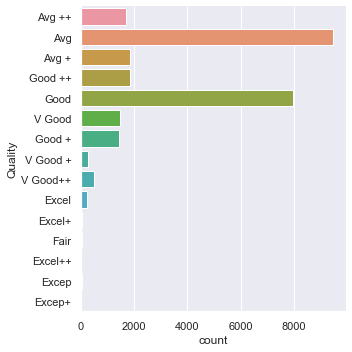

In [204]:
sns.catplot(y='Quality', data=X, kind='count')
plt.show()

In [205]:
# Create the Quality_cat column filled with zeros
X['Quality_cat'] = 0

X.loc[X['Quality']=='Avg', 'Quality_cat'] = 1
X.loc[X['Quality']=='Avg +', 'Quality_cat'] = 2
X.loc[X['Quality']=='Avg ++', 'Quality_cat'] = 3
X.loc[X['Quality']=='Good', 'Quality_cat'] = 4
X.loc[X['Quality']=='Good +', 'Quality_cat'] = 5
X.loc[X['Quality']=='Good ++', 'Quality_cat'] = 6
X.loc[X['Quality']=='V Good', 'Quality_cat'] = 7
X.loc[X['Quality']=='V Good +', 'Quality_cat'] = 8
X.loc[X['Quality']=='V Good++', 'Quality_cat'] = 9
X.loc[X['Quality']=='Excel', 'Quality_cat'] = 10
X.loc[X['Quality']=='Excel+', 'Quality_cat'] = 11
X.loc[X['Quality']=='Excel++', 'Quality_cat'] = 12
X.loc[X['Quality']=='Excep', 'Quality_cat'] = 13
X.loc[X['Quality']=='Excep+', 'Quality_cat'] = 14

In [206]:
X.columns


Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Condo', 'Design_1 Sty Townh',
       'Design_1-Sty Twnhm Condo', 'Design_Bi Level', 'Design_Det 1 Sty Condo',
       'Design_Det Mult Sty Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Condo', 'Design_Multi Sty Townh',
       'Design_Mutli Sty Twnhm Condo', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level', 'Quality_cat'],
      dtype='object')

In [207]:
fig = px.histogram(X, x="Quality_cat", title ='Property quality rating')
fig.show()

#### 'Garage Type' variable

In [208]:
X['Garage Type'].unique()

array(['Attached', 'Carport', 'Detached', 'None', 'Multiple', 'Basement',
       'Workshop'], dtype=object)

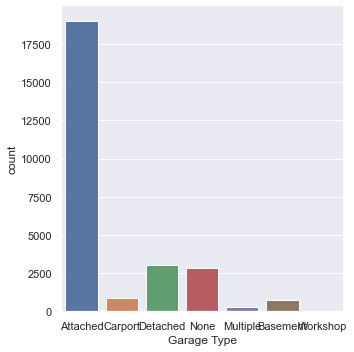

In [209]:
sns.catplot(x='Garage Type', data=X, kind='count')
plt.show()

Well it doesn't really makes sense to binarize the Attached vs all other, or maybe it does. For garage we will binarize to two categories 'attached' and 'other' since there are not many observations in other categories except attached. We create a new variable 'Garage Attached'

In [210]:
X['Garage Attached'] = 0
X.loc[X['Garage Type']=='Attached', 'Garage Attached'] = 1
X['Garage Attached'].sum()

19019

Encode market area as a categorical variable ranging from 1-5. I do not expect much effect from the market area, and perhaps a better idea would be to one hot encode them instead. 

In [211]:
X['Market Area Num'] = X['Market Area']

In [212]:
# Convert the Country column to a one hot encoded Data Frame
X = pd.get_dummies(X, columns=['Market Area Num'], prefix='Market Area')

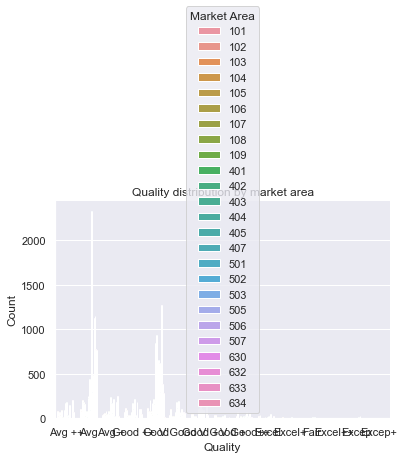

In [213]:
# Create a count plot of school with location subgroups
sns.countplot(x='Quality', data=X, hue='Market Area')
plt.title('Quality distribution by market area')
plt.xlabel('Quality')
plt.ylabel('Count')
sns.despine()
plt.show()

#### 'Above Grd SF' variable. 
We are interested in the distribution of square footage of single family homes.

In [214]:
X['Above Grd SF'].describe()

count    26837.000000
mean      1760.957223
std        817.450241
min        278.000000
25%       1136.000000
50%       1584.000000
75%       2211.000000
max       7659.000000
Name: Above Grd SF, dtype: float64

Text(0.5, 1.0, 'Basement and house area distribution')

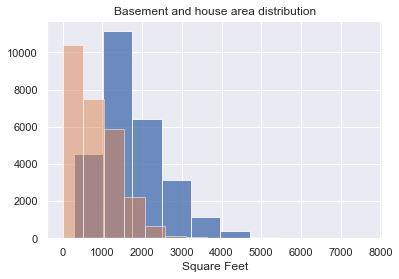

In [215]:
fig, ax = plt.subplots()
ax.hist(X['Above Grd SF'], alpha=0.8)
ax.hist(X['Basemt Tot SF'], alpha=0.5)
ax.set_xlabel('Square Feet')
ax.set_title ('Basement and house area distribution')


In [216]:
fig2 = px.box(X, y=["Above Grd SF"], width=400, height=300)
fig2.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig2.show()


<AxesSubplot:>

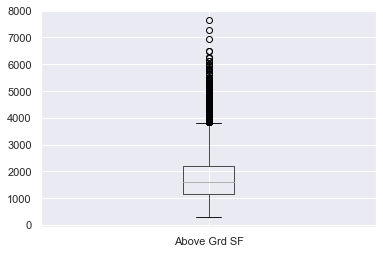

In [217]:
X[['Above Grd SF']].boxplot()

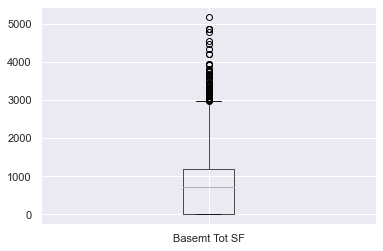

In [218]:
X[['Basemt Tot SF']].boxplot()
plt.show()

In [219]:
fig = px.box(X, y=["Basemt Tot SF"], width=400, height=300)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

So let's explore the Time adjusted sale price for outliers.

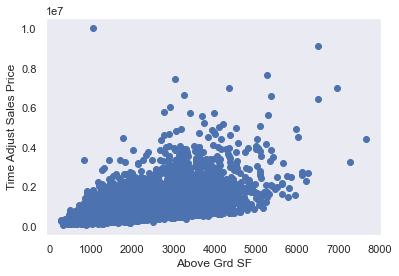

In [220]:
# Scatter plot
fig, ax = plt.subplots()
ax.scatter(X['Above Grd SF'], X['Time Adjust Sales Price'])

# x-axis label
ax.set_xlabel('Above Grd SF')

# y-axis label
ax.set_ylabel('Time Adjust Sales Price')
plt.grid()
plt.show()


We clearly have at least two outliers that will make our work much harder. Let's identify them and drop them. 

In [221]:
print(np.where(X['Time Adjust Sales Price']>3000000))

(array([ 4845,  4846,  7123,  7130,  7156,  7158,  7197,  7217,  7219,
        7220,  7222,  7233,  7235,  7237,  7240,  7241,  7248,  7293,
        7294,  7295,  7300,  7302,  7327,  7330,  7372,  7373,  7374,
        7376,  7399,  7408,  7409,  7410,  7411,  7413,  7431,  7432,
        7433,  7434,  7438,  7441,  7442,  7445,  7450,  7451,  7456,
        7477,  7479,  7480,  7481,  7482,  7484,  7488,  7500,  7535,
        7536,  7537,  7542,  7553,  7555,  7562,  7596,  7625,  7632,
        7634,  7894,  7897,  7900,  7901,  7952,  7961,  7983,  7988,
        8034,  8147,  8173,  8234,  8302,  8303,  8306,  8307,  8318,
        8321,  8327,  8333,  8335,  8347,  8354,  8384,  8458,  8474,
        8509,  8541,  8569,  8588,  8600,  8602,  8604,  8605,  8606,
        8607,  8608,  8609,  8614,  8615,  8616,  8617,  8618,  8620,
        8629,  8630,  8749,  8750,  8785,  9761,  9836,  9839, 10100,
       10101, 10102, 10105, 10182, 10184, 10210, 10213, 10224, 10228,
       10286, 10322

In [222]:
expensive = X.iloc[[ 4845,  4846,  7123,  7130,  7156,  7158,  7197,  7217,  7219,
        7220,  7222,  7233,  7235,  7237,  7240,  7241,  7248,  7293,
        7294,  7295,  7300,  7302,  7327,  7330,  7372,  7373,  7374,
        7376,  7399,  7408,  7409,  7410,  7411,  7413,  7431,  7432,
        7433,  7434,  7438,  7441,  7442,  7445,  7450,  7451,  7456,
        7477,  7479,  7480,  7481,  7482,  7484,  7488,  7500,  7535,
        7536,  7537,  7542,  7553,  7555,  7562,  7596,  7625,  7632,
        7634,  7894,  7897,  7900,  7901,  7952,  7961,  7983,  7988,
        8034,  8147,  8173,  8234,  8302,  8303,  8306,  8307,  8318,
        8321,  8327,  8333,  8335,  8347,  8354,  8384,  8458,  8474,
        8509,  8541,  8569,  8588,  8600,  8602,  8604,  8605,  8606,
        8607,  8608,  8609,  8614,  8615,  8616,  8617,  8618,  8620,
        8629,  8630,  8749,  8750,  8785,  9761,  9836,  9839, 10100,
       10101, 10102, 10105, 10182, 10184, 10210, 10213, 10224, 10228,
       10286, 10322, 10430, 10431, 10432, 10434, 10575, 10576, 10583,
       10584, 10585, 10639, 10643, 10679, 10681, 10682, 10685, 10687,
       10688, 10751, 11037, 11139, 21588, 21945, 22477, 22488, 22493,
       23654],]

In [223]:
expensive.head(4)


,Accout Number,Property Type,Property Address Street Number,Property Address Street Dir,Property Address Street Name,Property Address Street Suffix,Property Address Unit Number,Location,Design,Quality,...,Market Area_501,Market Area_502,Market Area_503,Market Area_505,Market Area_506,Market Area_507,Market Area_630,Market Area_632,Market Area_633,Market Area_634
4845,R0021798,SFR,10309,NaN,BASELINE,RD,NaN,LAFAYETTE,Ranch,Fair,...,0,0,0,0,0,0,0,0,0,0
4846,R0021589,SFR,10315,NaN,BASELINE,RD,NaN,LAFAYETTE,Ranch,Avg,...,0,0,0,0,0,0,0,0,0,0
7123,R0006612,SFR,655,NaN,12TH,ST,NaN,BOULDER,Multi Sty,Excel++,...,0,0,0,0,0,0,0,0,0,0
7130,R0008531,SFR,450,NaN,13TH,ST,NaN,BOULDER,Multi Sty,V Good++,...,0,0,0,0,0,0,0,0,0,0


In [224]:
expensive['Est Land SF'].sort_values(ascending=False)

4845     2937251.0
4846      490486.0
8629      216382.0
11037     106051.0
7327       96081.0
           ...    
21945          0.0
22477          0.0
22488          0.0
22493          0.0
23654          0.0
Name: Est Land SF, Length: 154, dtype: float64

In [225]:
X.iloc[[4845, 4846],:]

,Accout Number,Property Type,Property Address Street Number,Property Address Street Dir,Property Address Street Name,Property Address Street Suffix,Property Address Unit Number,Location,Design,Quality,...,Market Area_501,Market Area_502,Market Area_503,Market Area_505,Market Area_506,Market Area_507,Market Area_630,Market Area_632,Market Area_633,Market Area_634
4845,R0021798,SFR,10309,NaN,BASELINE,RD,NaN,LAFAYETTE,Ranch,Fair,...,0,0,0,0,0,0,0,0,0,0
4846,R0021589,SFR,10315,NaN,BASELINE,RD,NaN,LAFAYETTE,Ranch,Avg,...,0,0,0,0,0,0,0,0,0,0


From the investigation, only top 1 seems weird with 67 acre lot, next one has 11 acre lot, which is not impossible. Let's just check on zillow. The check showed that second one does have an 11 acre lot, but estimated the price to be 700000 USD. So I would adjust the sales price based on Zillow. For the first one it shows 0.71 acre lot. So we could update the data based on zillow for both.

In [226]:
X.loc[[4845, 4846],'Time Adjust Sales Price']=[372600, 700100]

In [227]:
X.loc[[4845],'Est Land SF'] = 30927

Now let's check the data visually again by plotting the scatterplot of Sales price vs Square footage

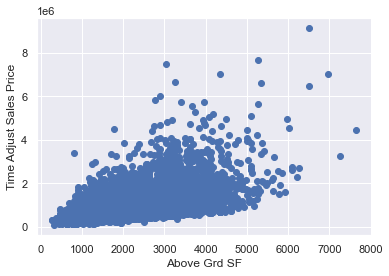

In [228]:
# Scatter plot
fig, ax = plt.subplots()
ax.scatter(X['Above Grd SF'], X['Time Adjust Sales Price'])

# x-axis label
ax.set_xlabel('Above Grd SF')

# y-axis label
ax.set_ylabel('Time Adjust Sales Price')
plt.show()

This doesn't look bad.

#### 'Est Land SF' variable 
Now let's look at land SF

In [229]:
print(X['Est Land SF'].describe())

fig = px.histogram(X, x="Est Land SF", title ='Land area')
fig.show()



count    2.683700e+04
mean     6.532733e+03
std      1.233278e+04
min      0.000000e+00
25%      1.625000e+03
50%      6.376000e+03
75%      8.266000e+03
max      1.295126e+06
Name: Est Land SF, dtype: float64


In [230]:
fig = px.scatter(X, y="Est Land SF", title ='Land area')
fig.show()

This doesn't look bad, there are only a few large properties and we already double checked the top point - 11 acre lot. 

Let's look at sales price by the market area. 

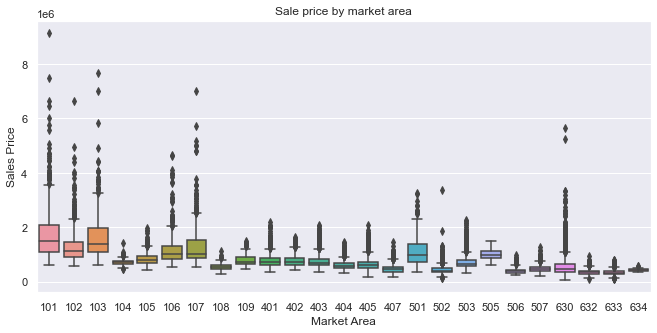

In [232]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=X)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sales Price')
_= plt.title('Sale price by market area')
_= sns.set(rc={'figure.figsize':(11,5)})
plt.show()

Boulder market areas(101-107) seem a bit more expensive on average compared to suburbs (401-405). 
There is also spike in Niwot Let's break up this graph into such areas.

In [233]:
boulder =X[X['Market Area']<400]
suburbs =X[X['Market Area']>=400]
print(boulder.shape)
print(suburbs.shape)

(4228, 66)
(22609, 66)


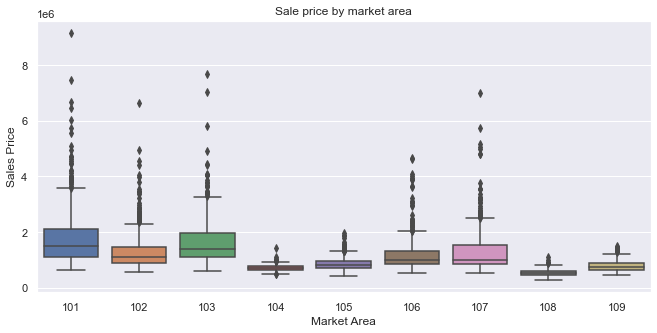

In [234]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=boulder)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sales Price')
_= plt.title('Sale price by market area')
plt.show()

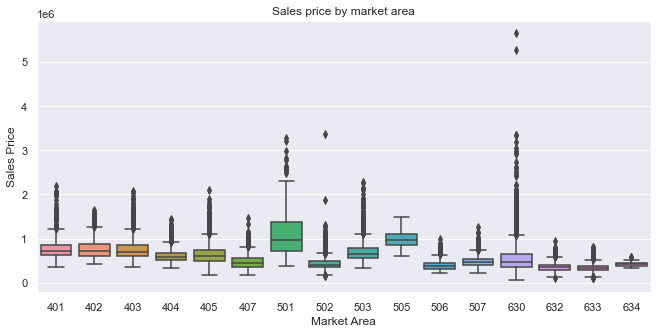

In [235]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=suburbs)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sales Price')
_= plt.title('Sales price by market area')
plt.show()

In [236]:
import plotly.express as px
fig = px.box(X, x='Location', y='Time Adjust Sales Price')
fig.show()

Looking at sale price by the market area, all areas seem about the same median.
There aren't many condos and townhomes is Erie and Superior, followed by Louisville and Lafayette, which seems to have the highest minimun. The most expensive properties are in boulder and Unincorporated (Niwot, Gunbarrel, Boulder). 

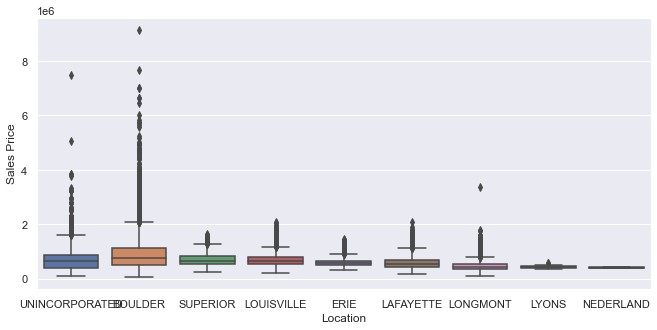

In [237]:
_ = sns.boxplot(x='Location', y='Time Adjust Sales Price', data=X)
_ = plt.xlabel('Location')
_ = plt.ylabel('Sales Price')
plt.show()

### Part 2. Pairwise correlations 

In [238]:
X[['Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Modular', 'Design_Multi Sty', 'Design_Paired', 'Design_Ranch',
       'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405']].head(4)

,Sale Date (Mon-Yr),Sale Price,Time Adjust Sales Price,Market Area,Unincorporated,Design_1 Sty Townh,Design_Bi Level,Design_Modular,Design_Multi Sty,Design_Paired,Design_Ranch,Design_Split level,Quality_cat,Garage Attached,Market Area_401,Market Area_402,Market Area_403,Market Area_404,Market Area_405
0,2017-11-03,517000,581143.136625,401,1,0,0,0,0,0,1,0,3,1,1,0,0,0,0
1,2018-05-10,597000,652607.758723,401,1,0,0,0,0,0,1,0,3,1,1,0,0,0,0
2,2019-06-21,531000,553206.861188,401,1,0,0,0,0,0,1,0,1,1,1,0,0,0,0
3,2019-11-06,484000,495706.522160,401,1,0,0,0,0,0,0,1,3,1,1,0,0,0,0


In [239]:
quantitative =['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Modular', 'Design_Multi Sty', 'Design_Paired', 'Design_Ranch',
       'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405']

In [240]:
quant =X[quantitative]

<AxesSubplot:>

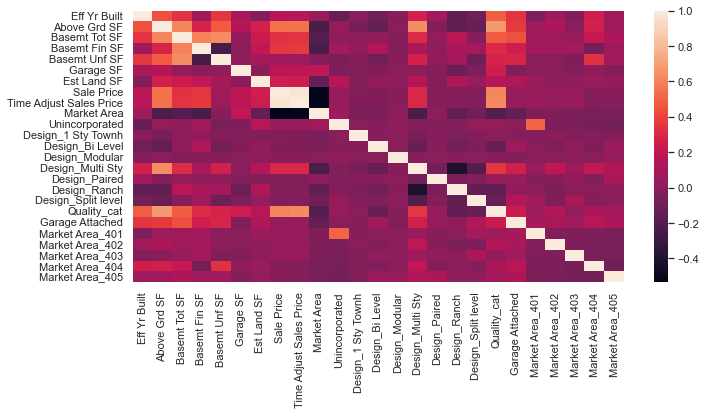

In [241]:
# calculate the correlation matrix
corr = quant.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

One thing is Unincorporated seems to be fully correlated with market area 401. Now I would like to see how the unincorporated properties are distributed between market areas. 

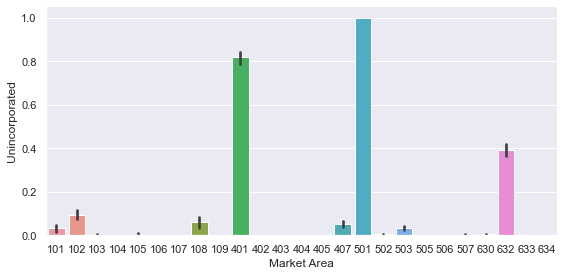

In [242]:
sns.catplot(
    data=X, x="Market Area", y="Unincorporated", 
    kind="bar", height=4, aspect=2,
)
plt.show()


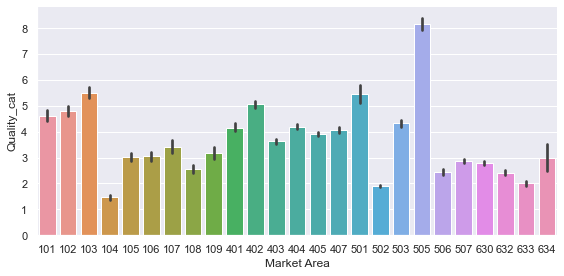

In [243]:
sns.catplot(
    data=X, x="Market Area", y="Quality_cat", 
    kind="bar", height=4, aspect=2,
)

It look like all the unincorporated properties are in Gunbarrel and none in other Market Areas.

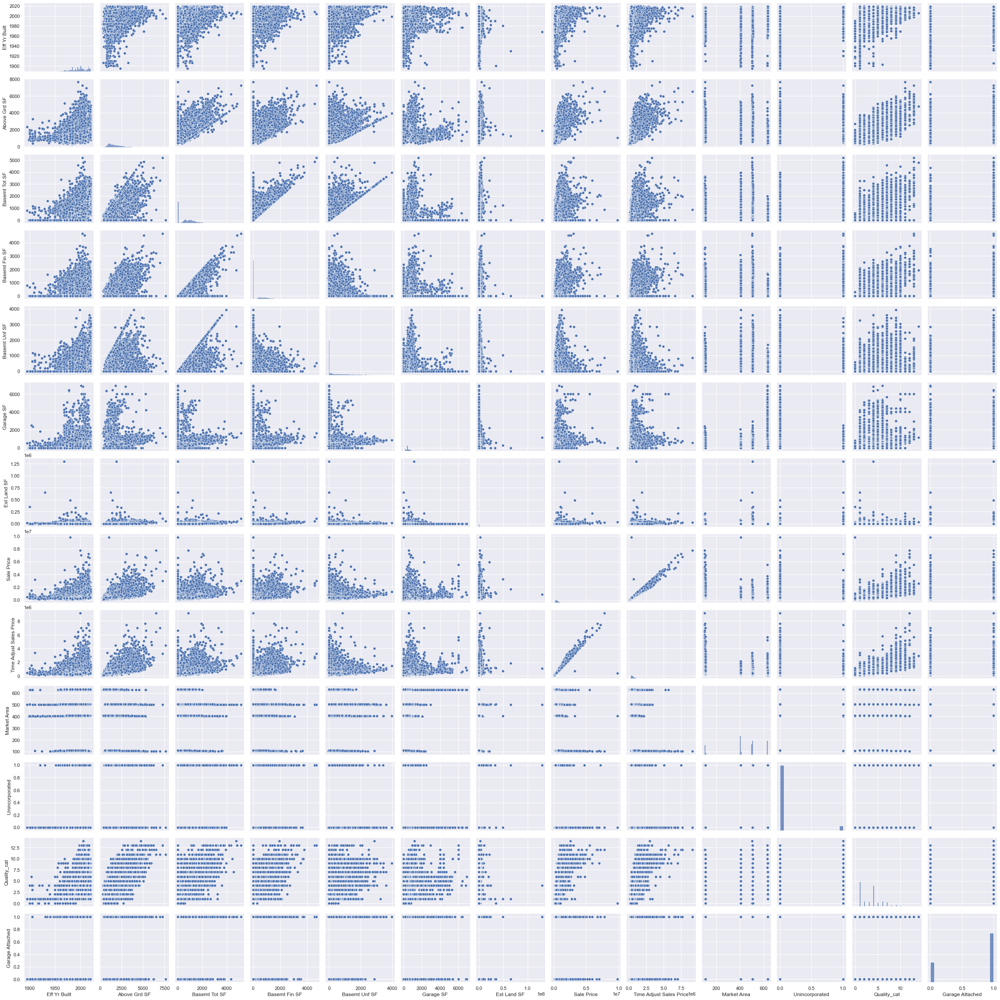

In [244]:
quant_no_dummies =X[['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Quality_cat', 'Garage Attached']]
sns.pairplot(quant_no_dummies)
plt.show()

<AxesSubplot:>

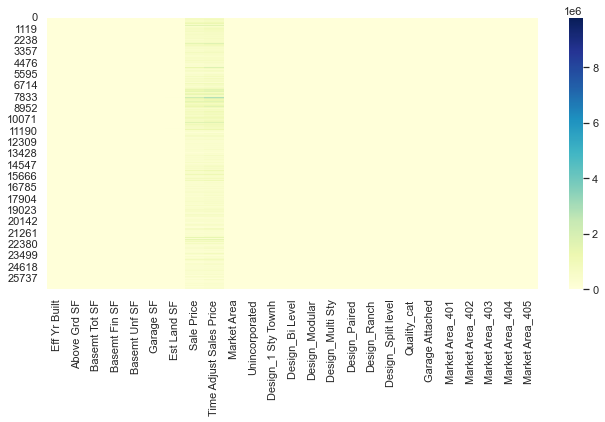

In [245]:
sns.heatmap(quant,cmap="YlGnBu")

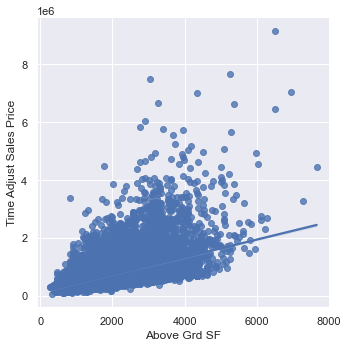

In [246]:
sns.lmplot(data=X, x="Above Grd SF", y="Time Adjust Sales Price")

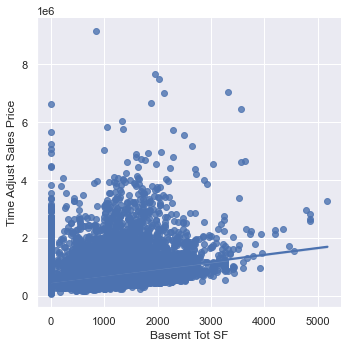

In [247]:
sns.lmplot(data=X, x="Basemt Tot SF", y="Time Adjust Sales Price")

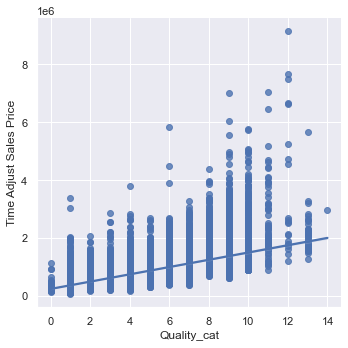

In [248]:
sns.lmplot(data=X, x="Quality_cat", y="Time Adjust Sales Price")

In [249]:
corr[corr>0.5]


,Eff Yr Built,Above Grd SF,Basemt Tot SF,Basemt Fin SF,Basemt Unf SF,Garage SF,Est Land SF,Sale Price,Time Adjust Sales Price,Market Area,...,Design_Paired,Design_Ranch,Design_Split level,Quality_cat,Garage Attached,Market Area_401,Market Area_402,Market Area_403,Market Area_404,Market Area_405
Eff Yr Built,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Above Grd SF,NaN,1.000000,0.614797,NaN,NaN,NaN,NaN,0.542108,0.550327,NaN,...,NaN,NaN,NaN,0.680418,NaN,NaN,NaN,NaN,NaN,NaN
Basemt Tot SF,NaN,0.614797,1.000000,0.597045,0.633753,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Basemt Fin SF,NaN,NaN,0.597045,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Basemt Unf SF,NaN,NaN,0.633753,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Garage SF,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Est Land SF,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sale Price,NaN,0.542108,NaN,NaN,NaN,NaN,NaN,1.000000,0.974962,NaN,...,NaN,NaN,NaN,0.613752,NaN,NaN,NaN,NaN,NaN,NaN
Time Adjust Sales Price,NaN,0.550327,NaN,NaN,NaN,NaN,NaN,0.974962,1.000000,NaN,...,NaN,NaN,NaN,0.626616,NaN,NaN,NaN,NaN,NaN,NaN
Market Area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [250]:
quantitative =['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Modular', 'Design_Multi Sty', 'Design_Paired', 'Design_Ranch',
       'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405']

### Are there variables that are particularly significant in terms of explaining the answer to your project question?
The significant variables for our analysis are:  <br>
● the year the house was built <br>
● above ground square footage<br>
● Basement square footage<br>
● basement finished square footage<br>
● Garage square footage<br>
● garage type<br>
● land square footage<br>
● house design<br>
● market area <br>

● Are there significant differences between subgroups in your data that may be relevant to your project aim?

Most Market Area subgroups seem to be pretty uniform, with Gunbarrel having unincorporated properties. 

● Are there strong correlations between pairs of independent variables or between an independent and a dependent variable?<br>

There are strong correlations between time adjusted sale price and sale price, so keep time adjusted sale price only. Market area 401 and unincorporated is 0.83687. Most unincorporated properties are located in Gunbarrel and some in Boulder. <br>


There is a significant correlation between basement total SF and Above Grd SF 0.502274. Bigger houses tend to have bigger basements.  <br>
There is a significant correlation between Garage SF and above Grd sF 0.590862. Bigger houses tend to have bigger garages. <br>
There is a significant correlation between basement unf and basement tot 0.560702. So we have some duplicated info between Basement total, Basement finished and Basement unfinished. Since Basement unfinished and Basement total are uncorrelated, we will drop the basement unfinished variable for our modeling stage. 
There is a significant correlation between quality and year built 0.507332. Older houses deteriorate more, lowering the quality.  <br>
There is a significant correlation between quality and above grd sF 0.717716. Bigger houses tend to be of better quality. If you rich, you're rich. Ok. <br>
There is a significant correlation between Quality and time adjusted sale price 0.566788, also makes sense. <br>

When we only had suburbs, we had the following correlations: 
There is a significant correlation between quality and sale price of 0.74.
There is significant correlation of 0.66 between Garage SF and Above Grd SF. 
There is significant correlation of 0.6 between Basement total and Basement unfinished. 
Correlation 0.59 between the above ground SF and sale price.
Correlation of 0.5 between garage SF and basement total SF.
Multi story design correlated with above grd SF at 0.53
Quality is correlated with Basement and Garage SF at 0.53 and 0.54. 
All of the above mentioned correlations are significant.

Looking at categorical variables, we can do chi square test by looking at quality and design or quality and market area. Testing Market Area and Quality, design and quality and Market area and Design, all pairs are not independent. 

Let's test the hypothesis that Market Area and Quality are independent. We will calculate a contingency table and perform a chi squared test. 

In [251]:
pd.crosstab(X['Market Area'], X['Quality'])

Quality,Avg,Avg +,Avg ++,Excel,Excel+,Excel++,Excep,Excep+,Fair,Good,Good +,Good ++,V Good,V Good +,V Good++
Market Area,,,,,,,,,,,,,,,
101,81,41,77,24,3,4,0,0,0,86,47,69,36,21,28
102,101,52,27,10,3,3,0,0,0,118,44,115,93,34,27
103,76,26,70,40,9,1,0,0,0,83,20,98,101,33,65
104,210,54,22,0,0,0,0,0,0,6,5,1,0,0,0
105,194,39,42,0,0,0,0,0,0,204,30,27,20,1,2
106,184,80,98,3,3,0,0,0,0,77,27,34,24,10,8
107,158,51,69,6,5,0,0,0,2,57,16,25,23,19,22
108,156,48,19,0,0,0,0,0,0,173,3,0,2,0,0
109,30,82,10,0,0,0,0,0,0,33,5,40,3,0,0


In [252]:
from scipy.stats import chi2_contingency
  
# defining the table
data = pd.crosstab(X['Market Area'], X['Quality'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


Now let's test the relationship between design and quality

In [253]:
# defining the table
data = pd.crosstab(X['Design'], X['Quality'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


Now let's test the relationship between design and Market Area

In [254]:
# defining the table
data = pd.crosstab(X['Market Area'], X['Design'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


For quantitative variables we'll use pearson's r

In [255]:
from scipy.stats.stats import pearsonr

#calculation correlation coefficient and p-value between x and y
pearsonr(X['Quality_cat'], X['Time Adjust Sales Price'])


(0.6266160741371923, 0.0)

And since the corresponding p-value is less than .05, we conclude that there is a statistically significant association between the two variables.

In [256]:
pearsonr(X['Garage SF'], X['Above Grd SF'])

(0.14892189479740714, 6.705694422320443e-133)

In [257]:
pearsonr(X['Basemt Tot SF'],X['Basemt Unf SF'])

(0.6337525530843112, 0.0)

In [258]:
pearsonr(X['Basemt Tot SF'], X['Garage SF'])

(0.025254734897974848, 3.508070229687882e-05)

In [259]:
pearsonr(X['Basemt Tot SF'], X['Quality_cat'])

(0.47495138969938105, 0.0)

In [260]:
pearsonr(X['Quality_cat'], X['Garage SF'])

(0.2413897748302739, 0.0)

In [261]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Condo', 'Design_1 Sty Townh',
       'Design_1-Sty Twnhm Condo', 'Design_Bi Level', 'Design_Det 1 Sty Condo',
       'Design_Det Mult Sty Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Condo', 'Design_Multi Sty Townh',
       'Design_Mutli Sty Twnhm Condo', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
    

So now it's time to save our X and Y variables ready for analysis. We keep the time adjusted sales price and drop the unfinished basement variable. 

In [262]:
data_for_modeling = X[['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF',
       'Garage SF', 'Est Land SF',  
       'Unincorporated', 'Quality_cat', 'Garage Attached',
       'Design_1 Sty Townh',
       'Design_1-Sty Twnhm Condo', 'Design_Bi Level', 'Design_Det 1 Sty Condo',
       'Design_Det Mult Sty Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Condo', 'Design_Multi Sty Townh',
       'Design_Mutli Sty Twnhm Condo', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
       'Market Area_104', 'Market Area_105', 'Market Area_106',
       'Market Area_107', 'Market Area_108', 'Market Area_109',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405', 'Market Area_407',
       'Market Area_501', 'Market Area_502', 'Market Area_503',
       'Market Area_505', 'Market Area_506', 'Market Area_507',
       'Market Area_630', 'Market Area_632', 'Market Area_633',
       'Market Area_634','Time Adjust Sales Price']]

In [263]:
data_for_modeling.to_csv('data/data_for_modeling.csv', index=False)